Downlaod the image

In [ ]:
url_and_filenames = [
    ('https://drive.google.com/uc?id=1TZuFbIml_iscyKtdZ9lEBrFo7lpJ2Gt6', 'bookpage_2.jpeg'),
    ('https://drive.google.com/uc?id=148EoA90O4d82DU-9DdrC3l4BkEUiUDCm', 'panther.jpeg'),
    ('https://drive.google.com/uc?id=1EGb-6qP30HB5DnQm0200e-FPAJRpdRA-', 'bookpage_1.jpeg'),
    ('https://drive.google.com/uc?id=1NFzqWNgWXJFm35HkBo6P3RLVLHt26B9m', 'tom.jpeg'),
]
for url, output_filename in url_and_filenames:
    !wget "{url}" -O "{output_filename}"

import numpy as np
import cv2
import matplotlib.pyplot as plt

Otsu function to find the threshold value and variance

In [ ]:
def otsu(image):
    h = np.zeros(256, dtype=int)
    for i in image.flatten():
        h[i]+=1

    pdf=h/image.size
    threshold=0
    max_var=0
    cdf=np.cumsum(pdf)
    mu=np.cumsum(pdf*np.arange(256))
    variance=np.zeros(256,dtype=float)
    for i in range(1,256):
        omega_1=cdf[i]
        omega_2=1-cdf[i]
        if omega_1==0 or omega_1==1:
            continue
        mu_1 = mu[i] / omega_1
        mu_2 = (mu[-1]-mu[i]) / omega_2
        variance[i]=omega_1 * omega_2 *((mu_2 - mu_1)**2)
        if variance[i] > max_var:
            max_var = variance[i]
            threshold = i

    return threshold, variance

Binarize the image according to the Otsu function

In [ ]:
def binarize(image, threshold):
    blank_image = np.zeros_like(image)
    blank_image[image > threshold] = 255
    return blank_image

Plotting the images and the histogram

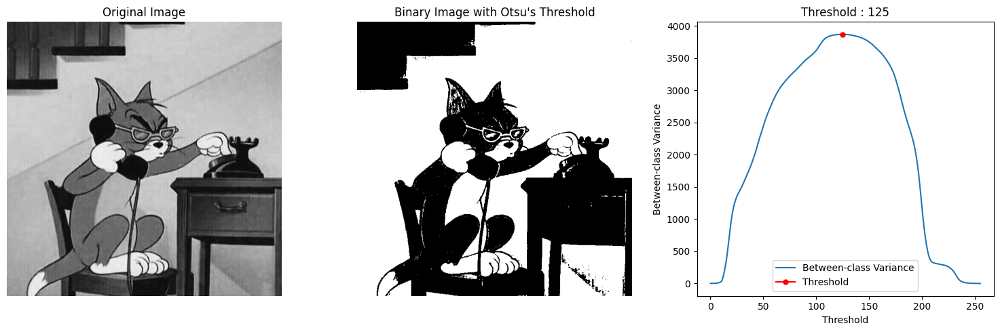

In [ ]:
image = cv2.imread(r"/content/tom.jpeg", 0)
threshold, variance = otsu(image)
binary_image = binarize(image, threshold)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image with Otsu\'s Threshold')
plt.axis('off')

plt.subplot(1, 3, 3)
optimal_variance = variance[threshold]

plt.plot(variance, label='Between-class Variance')
plt.plot(threshold, optimal_variance, marker='.', markersize=10, color='red', label='Threshold')
plt.title(f'Threshold : {threshold}')
plt.xlabel('Threshold')
plt.ylabel('Between-class Variance')
plt.legend()

plt.tight_layout()
plt.show()

Adding Noise the image

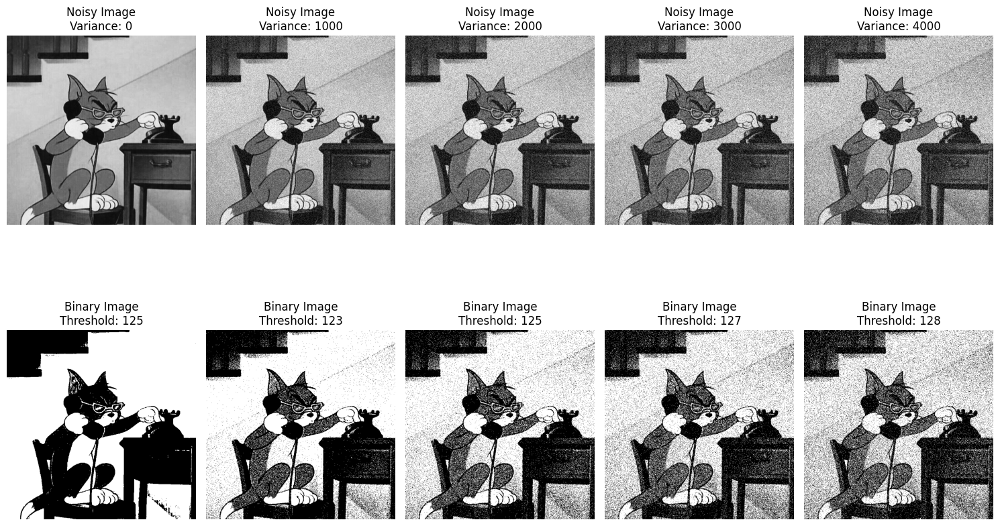

In [ ]:
def gaussian_noise(image, mean=0, variance=0):
    sigma = variance**0.5
    gauss = np.random.normal(mean, sigma, image.shape)
    noisy = image + gauss
    noisy = np.clip(noisy, 0, 255)
    return noisy.astype(np.uint8)
variances = [0, 1000, 2000, 3000, 4000]

plt.figure(figsize=(15, 10))
for i, variance in enumerate(variances, 1):
    noisy = gaussian_noise(image, mean=0, variance=variance)
    threshold,temp = otsu(noisy)
    binary_image = binarize(noisy, threshold)


    plt.subplot(2, len(variances), i)
    plt.imshow(noisy, cmap='gray')
    plt.title(f'Noisy Image\nVariance: {variance}')
    plt.axis('off')

    plt.subplot(2, len(variances), i + len(variances))
    plt.imshow(binary_image, cmap='gray')
    plt.title(f'Binary Image\nThreshold: {threshold}')
    plt.axis('off')

plt.tight_layout()
plt.show()


Examples

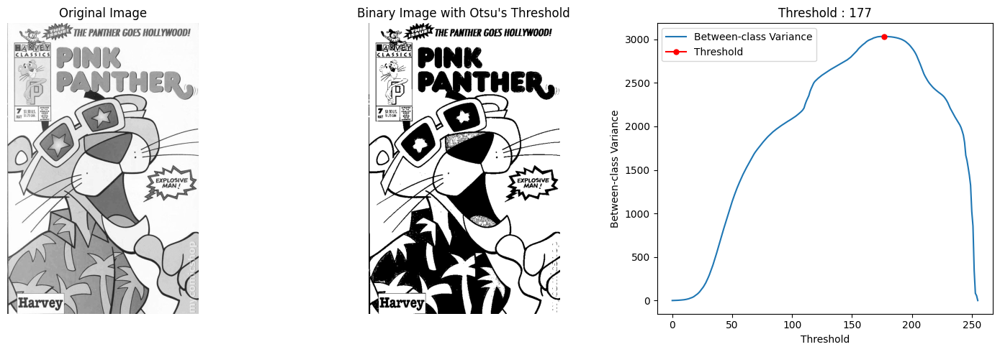

In [ ]:
# @title
image = cv2.imread(r"/content/panther.jpeg", 0)
threshold, variance = otsu(image)
binary_image = binarize(image, threshold)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image with Otsu\'s Threshold')
plt.axis('off')

plt.subplot(1, 3, 3)
optimal_variance = variance[threshold]

plt.plot(variance, label='Between-class Variance')
plt.plot(threshold, optimal_variance, marker='.', markersize=10, color='red', label='Threshold')
plt.title(f'Threshold : {threshold}')
plt.xlabel('Threshold')
plt.ylabel('Between-class Variance')
plt.legend()

plt.tight_layout()
plt.show()

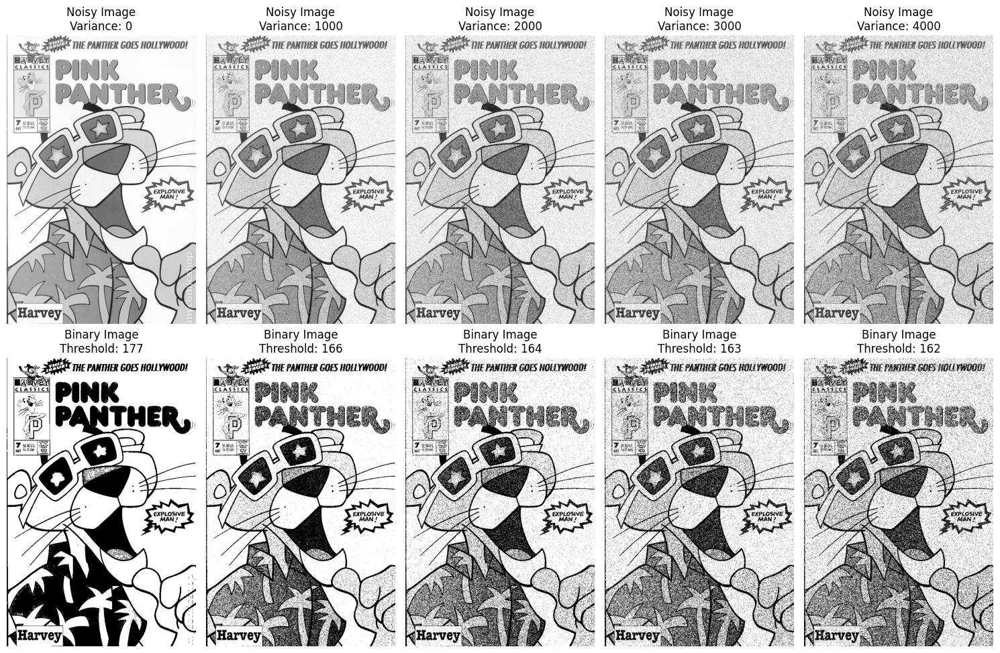

In [ ]:
# @title
def gaussian_noise(image, mean=0, variance=0):
    sigma = variance**0.5
    gauss = np.random.normal(mean, sigma, image.shape)
    noisy = image + gauss
    noisy = np.clip(noisy, 0, 255)
    return noisy.astype(np.uint8)
variances = [0, 1000, 2000, 3000, 4000]

plt.figure(figsize=(15, 10))
for i, variance in enumerate(variances, 1):
    noisy = gaussian_noise(image, mean=0, variance=variance)
    threshold,temp = otsu(noisy)
    binary_image = binarize(noisy, threshold)


    plt.subplot(2, len(variances), i)
    plt.imshow(noisy, cmap='gray')
    plt.title(f'Noisy Image\nVariance: {variance}')
    plt.axis('off')

    plt.subplot(2, len(variances), i + len(variances))
    plt.imshow(binary_image, cmap='gray')
    plt.title(f'Binary Image\nThreshold: {threshold}')
    plt.axis('off')

plt.tight_layout()
plt.show()


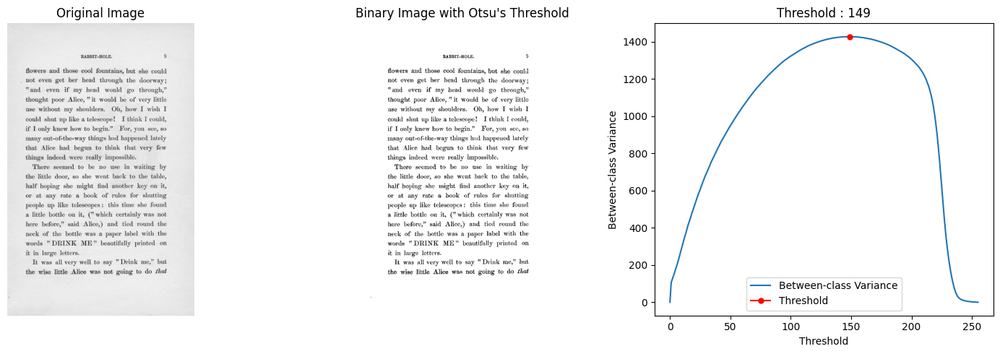

In [ ]:
# @title
image = cv2.imread(r"/content/bookpage_1.jpeg", 0)
threshold, variance = otsu(image)
binary_image = binarize(image, threshold)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image with Otsu\'s Threshold')
plt.axis('off')

plt.subplot(1, 3, 3)
optimal_variance = variance[threshold]

plt.plot(variance, label='Between-class Variance')
plt.plot(threshold, optimal_variance, marker='.', markersize=10, color='red', label='Threshold')
plt.title(f'Threshold : {threshold}')
plt.xlabel('Threshold')
plt.ylabel('Between-class Variance')
plt.legend()

plt.tight_layout()
plt.show()

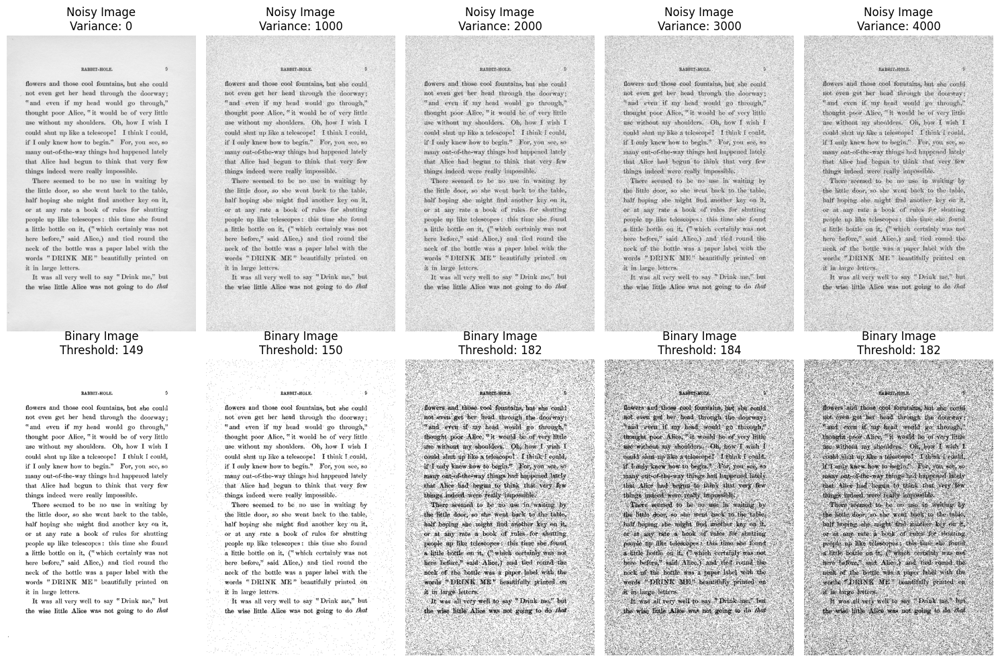

In [ ]:
# @title
def gaussian_noise(image, mean=0, variance=0):
    sigma = variance**0.5
    gauss = np.random.normal(mean, sigma, image.shape)
    noisy = image + gauss
    noisy = np.clip(noisy, 0, 255)
    return noisy.astype(np.uint8)
variances = [0, 1000, 2000, 3000, 4000]

plt.figure(figsize=(15, 10))
for i, variance in enumerate(variances, 1):
    noisy = gaussian_noise(image, mean=0, variance=variance)
    threshold,temp = otsu(noisy)
    binary_image = binarize(noisy, threshold)


    plt.subplot(2, len(variances), i)
    plt.imshow(noisy, cmap='gray')
    plt.title(f'Noisy Image\nVariance: {variance}')
    plt.axis('off')

    plt.subplot(2, len(variances), i + len(variances))
    plt.imshow(binary_image, cmap='gray')
    plt.title(f'Binary Image\nThreshold: {threshold}')
    plt.axis('off')

plt.tight_layout()
plt.show()


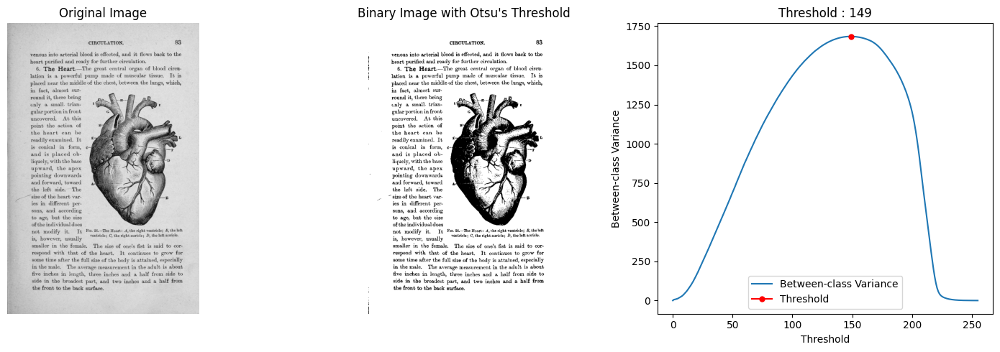

In [ ]:
# @title
image = cv2.imread(r"/content/bookpage_2.jpeg", 0)
threshold, variance = otsu(image)
binary_image = binarize(image, threshold)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image with Otsu\'s Threshold')
plt.axis('off')

plt.subplot(1, 3, 3)
optimal_variance = variance[threshold]

plt.plot(variance, label='Between-class Variance')
plt.plot(threshold, optimal_variance, marker='.', markersize=10, color='red', label='Threshold')
plt.title(f'Threshold : {threshold}')
plt.xlabel('Threshold')
plt.ylabel('Between-class Variance')
plt.legend()

plt.tight_layout()
plt.show()

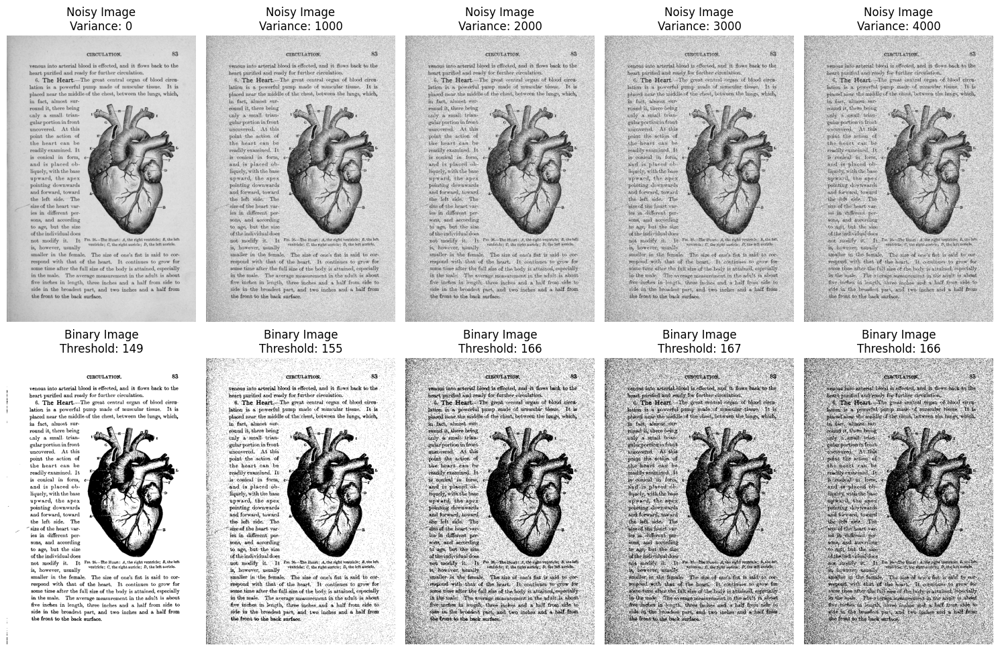

In [ ]:
# @title
def gaussian_noise(image, mean=0, variance=0):
    sigma = variance**0.5
    gauss = np.random.normal(mean, sigma, image.shape)
    noisy = image + gauss
    noisy = np.clip(noisy, 0, 255)
    return noisy.astype(np.uint8)
variances = [0, 1000, 2000, 3000, 4000]

plt.figure(figsize=(15, 10))
for i, variance in enumerate(variances, 1):
    noisy = gaussian_noise(image, mean=0, variance=variance)
    threshold,temp = otsu(noisy)
    binary_image = binarize(noisy, threshold)


    plt.subplot(2, len(variances), i)
    plt.imshow(noisy, cmap='gray')
    plt.title(f'Noisy Image\nVariance: {variance}')
    plt.axis('off')

    plt.subplot(2, len(variances), i + len(variances))
    plt.imshow(binary_image, cmap='gray')
    plt.title(f'Binary Image\nThreshold: {threshold}')
    plt.axis('off')

plt.tight_layout()
plt.show()
